<table>
<tr>                                                                                   
     <th>
         <div style='padding:15px;color:#030aa7;font-size:240%;text-align: center;font-style: italic;font-weight: bold;font-family: Georgia, serif'><a href="https://www.kaggle.com/datasets/eliasdabbas/web-server-access-logs/data">Analyse exploratoire des logs d’un serveur Web</a></div>
         <div style='text-align:center;color:#030aa7;font-size:120%;font-family:Georgia,serif'>Trafic · Qualité de service · Robots · Contenus · Acquisition</div>
     </th>
     <th></th>
 </tr>
<tr>                                                                                   
     <th><img src="https://raw.githubusercontent.com/rbizoi/dockerBigDataBI/refs/heads/master/images/log_web_server.png" width="1024"></th>
 </tr>    
</table>

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Introduction</div></b>

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Import des bibliothèques</div></b>

In [1]:
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.express as px
import pycountry
from IPython.display import display
import seaborn as sns, warnings, os
from datetime import datetime as dt
import matplotlib.font_manager as fm
import matplotlib.patheffects as path_effects

font1 = fm.FontProperties(size=20)
font2 = fm.FontProperties(size=24)

warnings.filterwarnings(action="ignore")

if int(str(sns.__version__).split('.')[1]) > 8 : 
    plt.style.use('seaborn-v0_8-darkgrid')
else:
    plt.style.use('seaborn-darkgrid')
sns.set(font_scale=3)

FICHIER = Path("/opt/spark/data/Web.Server.Access10.gzip")
UTILISER_DF_EXISTANT = True  # réutilise df s’il existe dans ce noyau
FUSEAU = "UTC"             # par exemple "Europe/Paris"
TOP_N = 10
TOP_CAMEMBERT = 6
repertoireRacine = Path(".")
nomProjet = "Analyse.exploratoire.logs"
repertoireProjet = repertoireRacine / nomProjet
repertoireDonnees = repertoireProjet / "repertoire.donnees"
repertoireImages = repertoireProjet / "repertoire.images"
for repertoire in (repertoireDonnees, repertoireImages):
    repertoire.mkdir(parents=True, exist_ok=True)
plt.rcParams.update({"figure.dpi": 110, "axes.spines.top": False,
                     "axes.spines.right": False, "font.size": 10})
COLONNES = ["datetime", "status", "method", "url_path", "geo_country",
            "geo_country_code", "browser", "os", "device_type",
            "referer_domain", "bytes", "ip_version"]

COLONNES += ["ip", "is_bot", "bot_name", "referer_type", "search_engine", "social_network"]


## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Outils du document</div></b>

In [2]:
# Palette et style repris du document de référence.
palette = ["#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973",
           "#0485d1", "#ff7855", "#fbeeac", "#0cb577", "#95a3a6", "#c071fe"]
plt.rcParams.update({"axes.prop_cycle": plt.cycler(color=palette),
                     "axes.titlecolor": "#030aa7", "axes.facecolor": "#f5f6f5"})

def exporter(table, nom):
    """Sauvegarder un tableau en Parquet, en conservant son index comme colonnes."""
    if isinstance(table, pd.Series):
        table = table.to_frame(name=table.name or "valeur")
    sortie = table.reset_index()
    sortie.columns = sortie.columns.map(str)
    sortie.to_parquet(repertoireDonnees / f"{nom}.parquet", engine="pyarrow",
                      compression="zstd", index=False)

def enregistrer(fig, nom):
    """Sauvegarder une figure indépendante, l’afficher puis libérer sa mémoire."""
    fig.savefig(repertoireImages / f"{nom}.png", dpi=140, bbox_inches="tight")
    plt.show()
    plt.close(fig)


In [3]:
def vide(ax):
    ax.text(.5, .5, "Aucune donnée exploitable", ha="center", va="center", transform=ax.transAxes)
    ax.set_axis_off()

def barres(ax, serie, titre, couleur):
    ax.set_title(titre, fontweight="bold")
    valeurs = serie.head(TOP_N).iloc[::-1]
    if valeurs.empty:
        vide(ax); return
    positions = np.arange(len(valeurs))
    ax.barh(positions, valeurs.values, color=couleur)
    ax.set_yticks(positions, [s if len(s) <= 42 else s[:39] + "…" for s in valeurs.index])
    ax.set_xlabel("Nombre de requêtes")
    ax.grid(axis="x", alpha=.2)
    ax.set_axisbelow(True)

def secteurs(ax, serie, titre):
    ax.set_title(titre, fontweight="bold")
    if serie.empty or serie.sum() == 0:
        vide(ax); return
    valeurs = serie.head(TOP_CAMEMBERT).copy()
    if len(serie) > TOP_CAMEMBERT:
        valeurs.loc["Autres catégories (regroupées)"] = serie.iloc[TOP_CAMEMBERT:].sum()
    parts, _, _ = ax.pie(valeurs.values, startangle=90, autopct=lambda p: f"{p:.1f}%" if p >= 3 else "",
                        pctdistance=.75, colors=palette,
                        wedgeprops={"width": .65, "edgecolor": "white"})
    ax.legend(parts, [f"{k} ({v:,})" for k,v in valeurs.items()], loc="upper center",
              bbox_to_anchor=(.5, -.03), fontsize=8, frameon=False)



In [4]:
SEUIL_REQUETES = 100
TOP_IP = 10
NB_CLASSES_TAILLE = 70

def nettoyer(s):
    return s.fillna("Non renseigné").replace({"": "Non renseigné", "-": "Non renseigné"})

def par_categorie(colonne):
    temp = pd.DataFrame({"categorie": nettoyer(df[colonne]), "erreur": erreurs.to_numpy()})
    tab = temp.groupby("categorie", observed=True).agg(requetes=("erreur", "size"), erreurs=("erreur", "sum"))
    tab["taux_erreur_pct"] = 100 * tab.erreurs / tab.requetes
    return tab.sort_values("requetes", ascending=False)

def graphique_taux(tab, titre, nom):
    selection = tab.loc[tab.requetes >= SEUIL_REQUETES].sort_values("taux_erreur_pct", ascending=False).head(TOP_N).iloc[::-1]
    fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
    if selection.empty:
        vide(ax)
    else:
        pos = np.arange(len(selection))
        ax.barh(pos, selection.taux_erreur_pct, color=palette[0])
        ax.set_yticks(pos, [f"{str(k)[:65]} (n={int(n):,})" for k,n in zip(selection.index, selection.requetes)])
        ax.set_xlabel("Taux de requêtes 4xx ou 5xx (%)")
    ax.set_title(f"{titre} • minimum {SEUIL_REQUETES} requêtes")
    enregistrer(fig, nom)
    exporter(tab, nom)



# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Lecture des données</div></b>

In [5]:
if UTILISER_DF_EXISTANT and "df" in globals():
    if not isinstance(df, pd.DataFrame):
        raise TypeError("df doit être un DataFrame pandas.")
    print("Utilisation du DataFrame df déjà chargé.")
else:
    if not FICHIER.exists():
        raise FileNotFoundError(f"Modifiez FICHIER : {FICHIER}")
    with FICHIER.open("rb") as f:
        signature = f.read(4)
    if signature != b"PAR1":
        raise ValueError("Le fichier attendu doit être un Parquet enrichi ; un log brut doit être parsé en amont.")
    df = pd.read_parquet(FICHIER, engine="pyarrow")

manquantes = sorted(set(COLONNES) - set(df.columns))
if manquantes:
    raise ValueError(f"Colonnes manquantes : {manquantes}")
if df.empty:
    raise ValueError("Le DataFrame est vide.")
print(f"{len(df):,} requêtes ; {len(df.columns)} colonnes chargées.")
display(df[COLONNES].dtypes.rename("Type").to_frame())


10,365,076 requêtes ; 55 colonnes chargées.


,Type
datetime,"datetime64[ns, UTC]"
status,Int64
method,str
url_path,str
geo_country,str
geo_country_code,str
browser,str
os,str
device_type,str
referer_domain,str


## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Description des variables</div></b>

| Famille | Variables | Utilisation |
|---|---|---|
| Temps | `datetime` | Trafic horaire, jours, rafales |
| Requêtes | `method`, `url_path`, `status`, `bytes` | HTTP, erreurs, contenu, volumes |
| Origines | `referer_domain`, `referer_type`, `search_engine`, `social_network` | Acquisition |
| Clients | `browser`, `os`, `device_type`, `is_bot`, `bot_name` | Profils et robots |
| Réseau | `ip`, `ip_version` | Activité et versions IP |
| Géographie | `geo_country`, `geo_country_code` | Pays et carte |

Les adresses IP des analyses détaillées sont remplacées par des identifiants locaux. Les chemins et domaines restent présents dans leurs agrégats. Les numéros d’IP anonymes peuvent changer si les données changent.

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Valeurs non renseignées et préparation</div></b>

Les catégories absentes sont conservées comme « Non renseigné ». Les camemberts regroupent les petites catégories ; les classements en barres montrent seulement le top N. Les référents vides ou `-` sont écartés du classement des sites, sans les assimiler automatiquement à du trafic direct. Les tailles manquantes ou négatives sont exclues de l’histogramme et comptabilisées dans le contrôle qualité. Les dates invalides sont exclues uniquement des graphiques temporels.

In [6]:
def effectifs(serie):
    # Normaliser après value_counts limite le traitement de chaînes aux valeurs distinctes.
    brut = serie.value_counts(dropna=False)
    resultat = {}
    for cle, nombre in brut.items():
        label = "Non renseigné" if pd.isna(cle) else str(cle).strip()
        if label in ("", "-", "None", "nan", "<NA>"):
            label = "Non renseigné"
        resultat[label] = resultat.get(label, 0) + int(nombre)
    return pd.Series(resultat, dtype="int64").sort_values(ascending=False)

comptages = {c: effectifs(df[c]) for c in ["status", "method", "url_path", "geo_country", "geo_country_code", "browser", "os", "device_type", "referer_domain", "ip_version"]}
dates = pd.to_datetime(df["datetime"], utc=True, errors="coerce").dt.tz_convert(FUSEAU)
dates_valides = dates.dropna()
if dates_valides.empty:
    trafic = pd.Series(dtype="int64")
else:
    # Arrondi en UTC pour distinguer les heures répétées au changement d’heure.
    heures = dates_valides.dt.tz_convert("UTC").dt.floor("h")
    trafic = heures.value_counts().sort_index()
    trafic = trafic.reindex(pd.date_range(trafic.index.min(), trafic.index.max(), freq="h"), fill_value=0)
    trafic.index = trafic.index.tz_convert(FUSEAU)
    del heures
heatmap = pd.crosstab(dates_valides.dt.dayofweek, dates_valides.dt.hour).reindex(
    index=range(7), columns=range(24), fill_value=0)
tailles = pd.to_numeric(df["bytes"], errors="coerce")
tailles_valides = tailles[tailles.notna() & tailles.ge(0)].to_numpy(dtype=float)
if len(tailles_valides):
    maximum = tailles_valides.max()
    # Classes uniformes sur toute la plage : aucune grosse réponse n’est supprimée.
    histogramme, bornes = np.histogram(tailles_valides, bins=60, range=(0, max(1, maximum)))
else:
    histogramme, bornes = np.zeros(60, dtype=int), np.linspace(0, 1, 61)
qualite = pd.Series({
    "Requêtes totales": len(df),
    "Dates absentes / invalides": int(dates.isna().sum()),
    "Tailles absentes / invalides / négatives": len(df) - len(tailles_valides),
    "Pays non renseignés": int(comptages["geo_country"].get("Non renseigné", 0)),
    "Référents non renseignés": int(comptages["referer_domain"].get("Non renseigné", 0)),
}, name="Nombre")
display(qualite.to_frame())
if len(trafic):
    print(f"Période : {dates_valides.min()} → {dates_valides.max()}")
del tailles_valides, tailles, dates_valides, dates


,Nombre
Requêtes totales,10365076
Dates absentes / invalides,0
Tailles absentes / invalides / négatives,0
Pays non renseignés,46932
Référents non renseignés,1646319


Période : 2019-01-22 00:26:14+00:00 → 2019-01-26 16:59:13+00:00


In [7]:
temps = pd.to_datetime(df.datetime, errors="coerce", utc=True)
heure = temps.dt.floor("h")
statuts = pd.to_numeric(df.status, errors="coerce")
erreurs4 = statuts.between(400, 499).fillna(False)
erreurs5 = statuts.between(500, 599).fillna(False)
erreurs = erreurs4 | erreurs5
bot = df.is_bot.astype("boolean")
label_bot = bot.map({True: "Bots identifiés", False: "Non identifiés comme bots"}).fillna("Non renseigné")
temp = pd.DataFrame({"heure": heure, "4xx": erreurs4, "5xx": erreurs5})
horaire = temp.groupby("heure").agg(requetes=("4xx", "size"), erreurs4=("4xx", "sum"), erreurs5=("5xx", "sum"))
if not horaire.empty:
    horaire = horaire.reindex(pd.date_range(horaire.index.min(), horaire.index.max(), freq="h"), fill_value=0)
    horaire.index = horaire.index.tz_convert(FUSEAU)
horaire["taux4_pct"] = 100 * horaire.erreurs4 / horaire.requetes.replace(0, np.nan)
horaire["taux5_pct"] = 100 * horaire.erreurs5 / horaire.requetes.replace(0, np.nan)
del temp

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Statistiques descriptives et analyse des données</div></b>

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Statistiques descriptives</div></b>

In [8]:
# Résumé des seules mesures numériques utiles, sans analyser les identifiants comme mesures.
resume_numerique = df[["status", "bytes"]].describe()
display(resume_numerique)
exporter(resume_numerique, "statistiques_descriptives")
exporter(qualite, "controle_qualite_initial")

,status,bytes
count,10365076.0,10365076.0
mean,210.140553,12433.193573
std,39.210945,28126.6234
min,200.0,0.0
25%,200.0,2027.0
50%,200.0,4120.0
75%,200.0,11551.0
max,504.0,1249490.0


## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Structure et distribution du trafic</div></b>

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 01 — Trafic au fil du temps</div></b>

**Objectif :** Repérer les variations du volume horaire.

**Lecture :** La hauteur de la courbe indique les requêtes de chaque heure.

**Point de vigilance :** Les heures de début et fin peuvent être incomplètes.

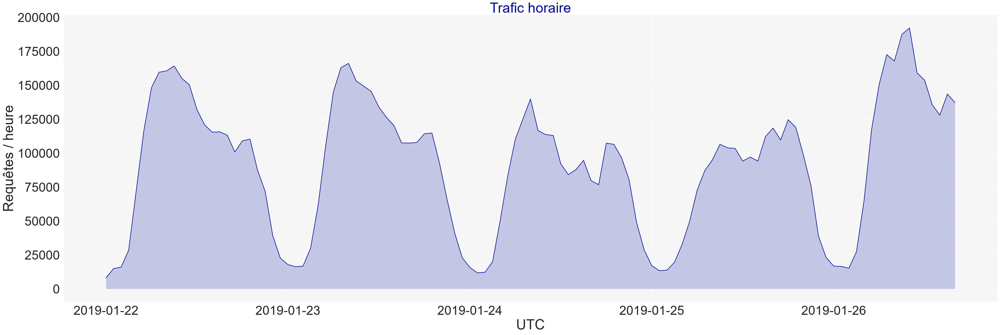

In [9]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
if trafic.empty: vide(ax)
else:
    ax.plot(trafic.index, trafic.values)
    ax.fill_between(trafic.index, trafic.values, alpha=.2)
    ax.set_ylabel("Requêtes / heure"); ax.set_xlabel(FUSEAU)
ax.set_title("Trafic horaire")
enregistrer(fig, "01_trafic"); exporter(trafic.rename("requetes"), "01_trafic")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 02 — Codes HTTP</div></b>

**Objectif :** Décrire la composition des requêtes.

**Lecture :** Les parts montrent la fréquence de chaque code HTTP.

**Point de vigilance :** Les petites catégories sont regroupées dans « Autres catégories ».

In [10]:
def secteurs(ax, serie, titre):
    ax.set_title(titre, fontweight="bold")
    if serie.empty or serie.sum() == 0:
        vide(ax); return
    valeurs = serie.head(TOP_CAMEMBERT).copy()
    if len(serie) > TOP_CAMEMBERT:
        valeurs.loc["Autres catégories (regroupées)"] = serie.iloc[TOP_CAMEMBERT:].sum()
    parts, texts, autotexts = ax.pie(valeurs.values, startangle=90, autopct=lambda p: f"{p:.1f}%" if p >= 3 else "",
                                     pctdistance=.75, colors=palette,
                                     wedgeprops={"width": .65, "edgecolor": "white"})
    
    plt.setp(autotexts, size=24, weight="bold",color="w")
    plt.setp(texts, size=64, weight="bold")
    ax.legend(parts, [f"{k} ({v:,})" for k,v in valeurs.items()], loc="upper right",
              bbox_to_anchor=(0, 1), title_fontsize='x-large', fontsize='x-large', frameon=False)


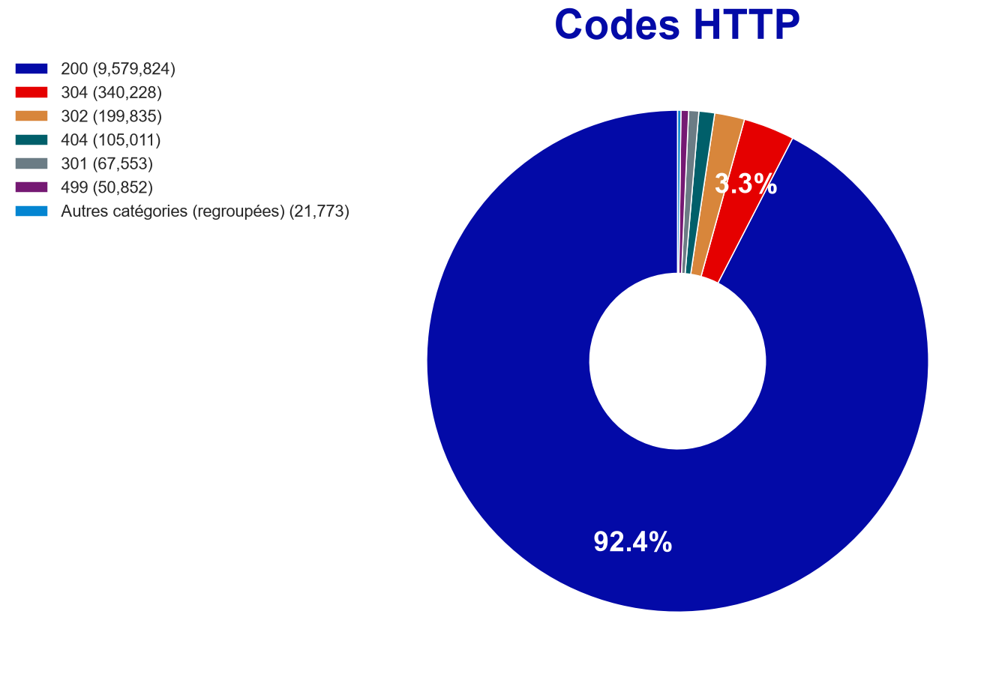

In [11]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(12,10), layout="constrained")
secteurs(ax, comptages["status"], "Codes HTTP")

enregistrer(fig, "02_status"); exporter(comptages["status"].rename("requetes"), "02_status")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 03 — Méthodes HTTP</div></b>

**Objectif :** Décrire la composition des requêtes.

**Lecture :** Comparer la fréquence des méthodes GET, POST et autres.

**Point de vigilance :** Les petites catégories sont regroupées dans « Autres catégories ».

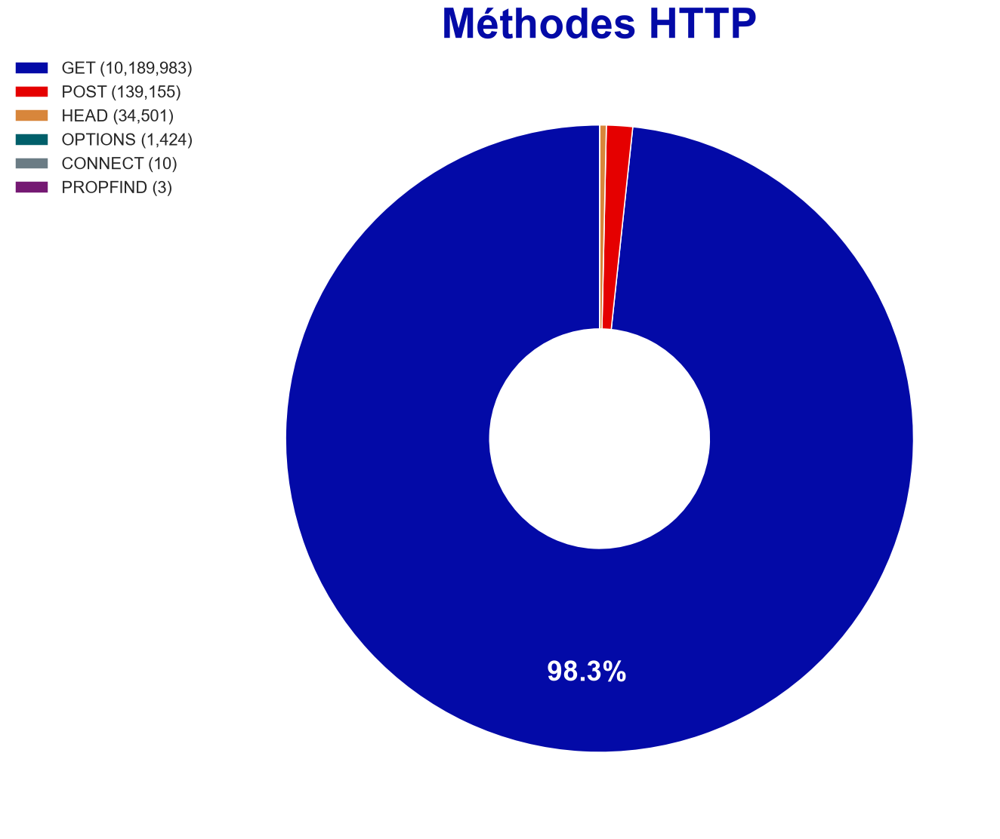

In [12]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(12,10), layout="constrained")
secteurs(ax, comptages["method"], "Méthodes HTTP")
enregistrer(fig, "03_method"); exporter(comptages["method"].rename("requetes"), "03_method")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 04 — Pages les plus demandées</div></b>

**Objectif :** Identifier les catégories les plus fréquentes.

**Lecture :** Les barres sont classées par nombre de requêtes.

**Point de vigilance :** Le classement est un top ; il ne représente pas des visiteurs uniques.

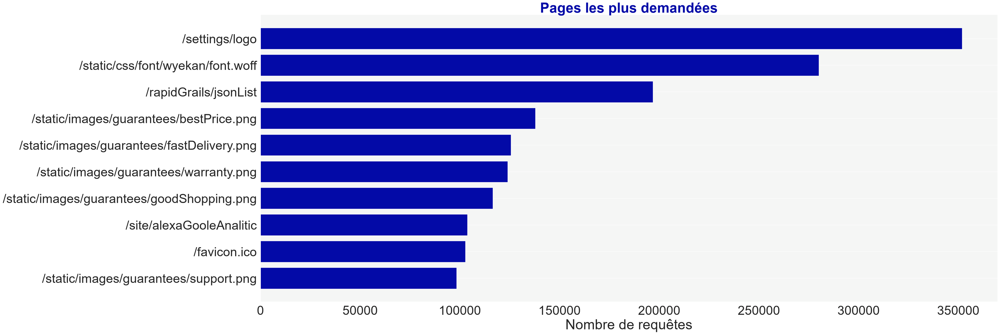

In [13]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
barres(ax, comptages["url_path"], "Pages les plus demandées", palette[0])
enregistrer(fig, "04_url_path"); exporter(comptages["url_path"].rename("requetes"), "04_url_path")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 05 — Origine géographique par pays</div></b>

**Objectif :** Identifier les catégories les plus fréquentes.

**Lecture :** Les barres sont classées par nombre de requêtes.

**Point de vigilance :** Le classement est un top ; il ne représente pas des visiteurs uniques.

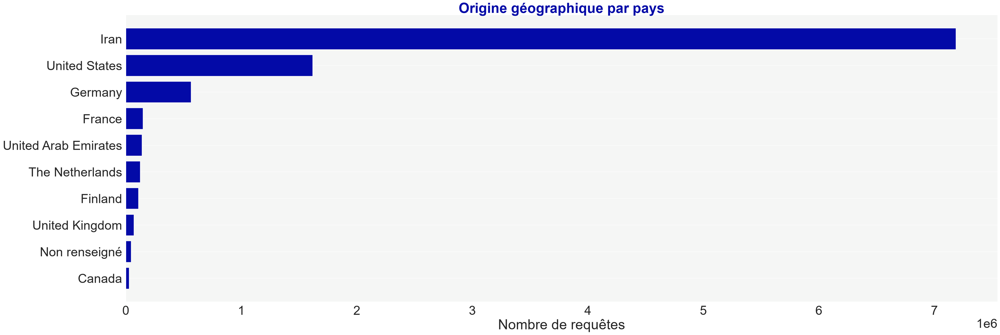

In [14]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
barres(ax, comptages["geo_country"], "Origine géographique par pays", palette[0])
enregistrer(fig, "05_geo_country"); exporter(comptages["geo_country"].rename("requetes"), "05_geo_country")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 06 — Carte du monde</div></b>

**Objectif :** Visualiser la répartition géographique.

**Lecture :** Le survol donne les effectifs exacts ; la couleur utilise log10(1 + requêtes).

**Point de vigilance :** Les codes pays inconnus sont exclus et leur nombre est affiché.

In [15]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
lignes_carte, non_cartographiees = [], 0
for pays, nombre in comptages["geo_country_code"].items():
    cle = pays.upper()
    pays_iso = (pycountry.countries.get(alpha_2=cle) if len(cle) == 2 else
                pycountry.countries.get(alpha_3=cle) if len(cle) == 3 else None)
    if pays_iso is None:
        non_cartographiees += int(nombre)
    else:
        lignes_carte.append({"iso3": pays_iso.alpha_3, "Pays": pays_iso.name, "Requêtes": int(nombre)})
carte_donnees = pd.DataFrame(lignes_carte, columns=["iso3", "Pays", "Requêtes"])
print(f"Requêtes non cartographiées (code pays absent ou inconnu) : {non_cartographiees:,}")
if not carte_donnees.empty:
    carte_donnees = carte_donnees.groupby(["iso3", "Pays"], as_index=False)["Requêtes"].sum()
    carte_donnees["Intensité"] = np.log10(1 + carte_donnees["Requêtes"])
    carte = px.choropleth(carte_donnees, locations="iso3", locationmode="ISO-3",
                          color="Intensité", hover_name="Pays",
                          hover_data={"iso3": False, "Intensité": False, "Requêtes": ":,"},
                          color_continuous_scale="Blues", projection="natural earth",
                          title="Origine géographique des requêtes")
    carte.update_geos(showcoastlines=True, showcountries=True, showframe=False)
    carte.update_layout(height=600, coloraxis_colorbar_title="log10(1 + requêtes)")
    carte.write_html(repertoireImages / "carte_monde.html", include_plotlyjs=True)
    carte.show()
else:
    print("Aucun code pays ISO exploitable : aucune carte ne peut être colorée.")

exporter(carte_donnees, "06_carte_pays")

Requêtes non cartographiées (code pays absent ou inconnu) : 46,937


### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 07 — Navigateurs</div></b>

**Objectif :** Décrire les clients à l’origine des requêtes.

**Lecture :** Les secteurs représentent des parts de requêtes.

**Point de vigilance :** La détection dépend des informations du user-agent, notamment pour les bots.

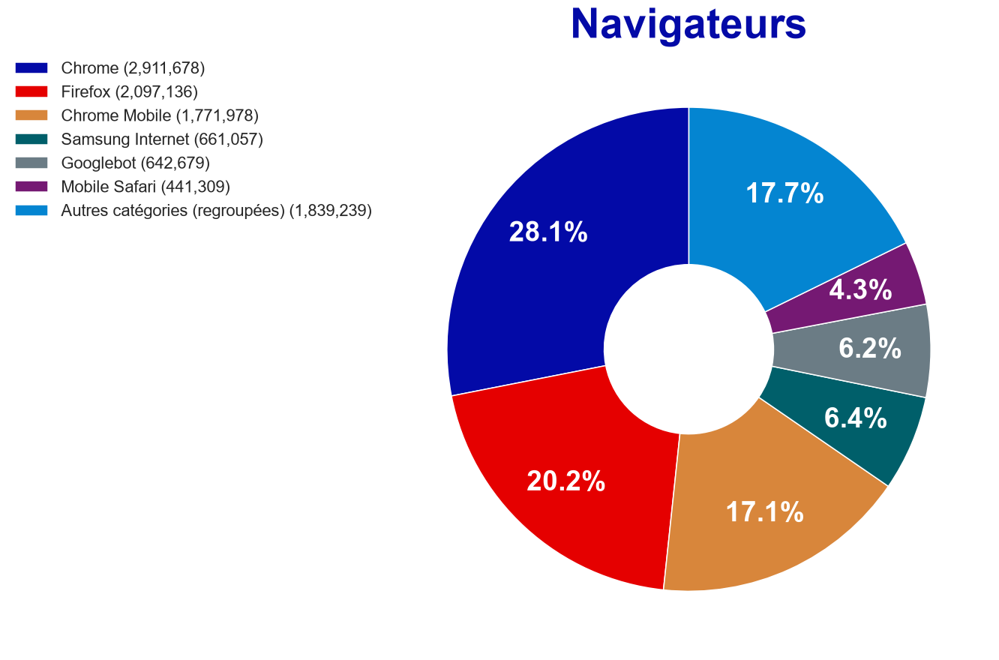

In [16]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(12,10), layout="constrained")
secteurs(ax, comptages["browser"], "Navigateurs")
enregistrer(fig, "07_browser"); exporter(comptages["browser"].rename("requetes"), "07_browser")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 08 — Systèmes d’exploitation</div></b>

**Objectif :** Décrire les clients à l’origine des requêtes.

**Lecture :** Les secteurs représentent des parts de requêtes.

**Point de vigilance :** La détection dépend des informations du user-agent, notamment pour les bots.

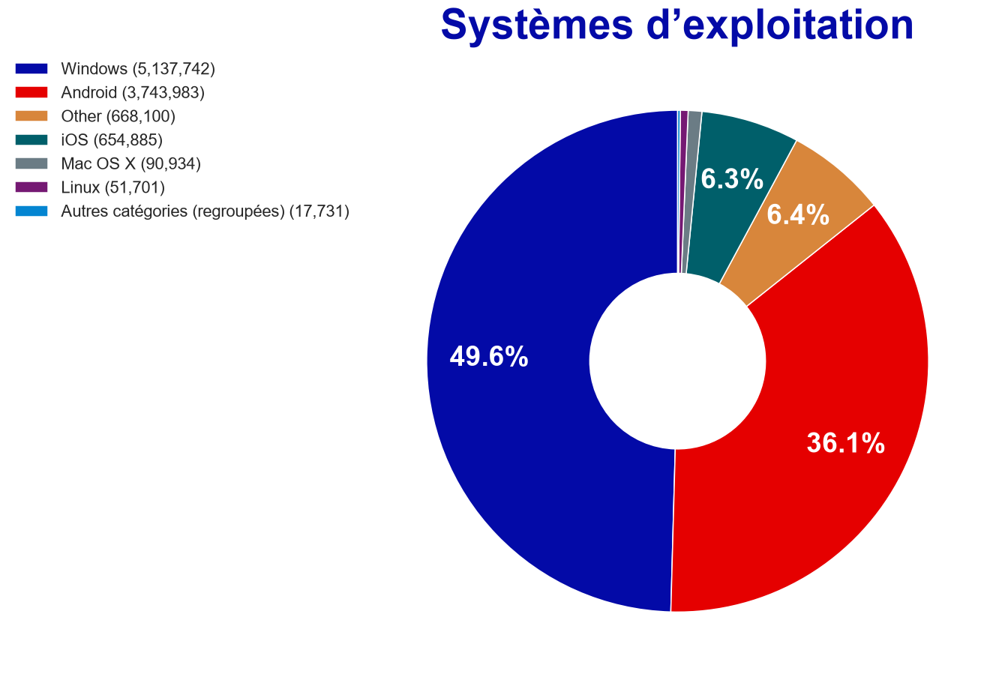

In [17]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(12,10), layout="constrained")
secteurs(ax, comptages["os"], "Systèmes d’exploitation")
enregistrer(fig, "08_os"); exporter(comptages["os"].rename("requetes"), "08_os")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 09 — Types d’appareils</div></b>

**Objectif :** Décrire les clients à l’origine des requêtes.

**Lecture :** Les secteurs représentent des parts de requêtes.

**Point de vigilance :** La détection dépend des informations du user-agent, notamment pour les bots.

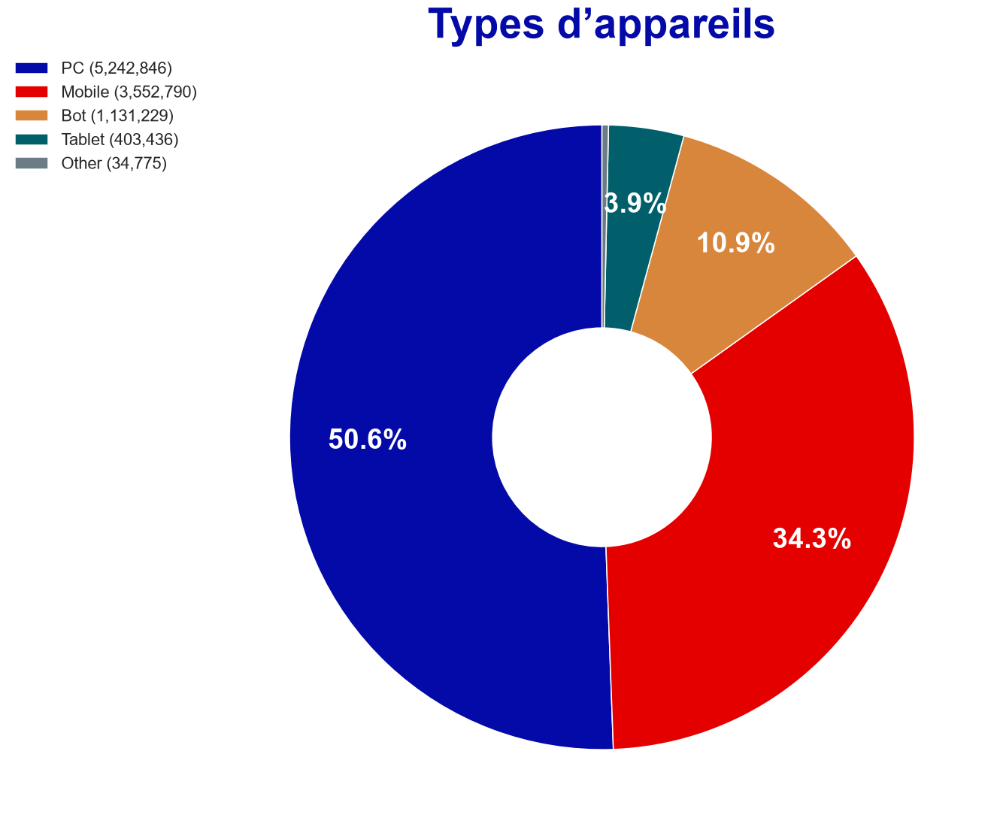

In [18]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(12,10), layout="constrained")
secteurs(ax, comptages["device_type"], "Types d’appareils")
enregistrer(fig, "09_device_type"); exporter(comptages["device_type"].rename("requetes"), "09_device_type")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 10 — Sites référents</div></b>

**Objectif :** Identifier les domaines qui précèdent la requête.

**Lecture :** Les barres mesurent les requêtes associées à chaque domaine.

**Point de vigilance :** Un référent absent ne prouve pas un accès direct.

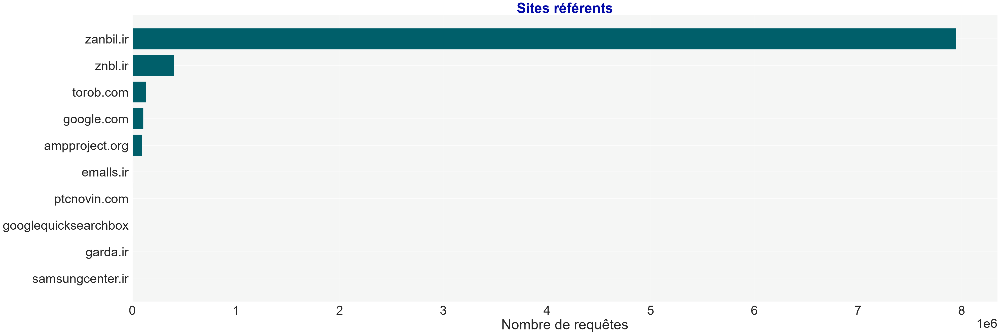

In [19]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
referents = comptages["referer_domain"].drop("Non renseigné", errors="ignore")
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
barres(ax, referents, "Sites référents", palette[3])
enregistrer(fig, "10_referents"); exporter(referents.rename("requetes"), "10_referents")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 11 — Requêtes par jour et heure</div></b>

**Objectif :** Repérer les créneaux chargés.

**Lecture :** Les couleurs indiquent les volumes cumulés pour chaque couple jour/heure.

**Point de vigilance :** La figure ne corrige pas le nombre de jours observés.

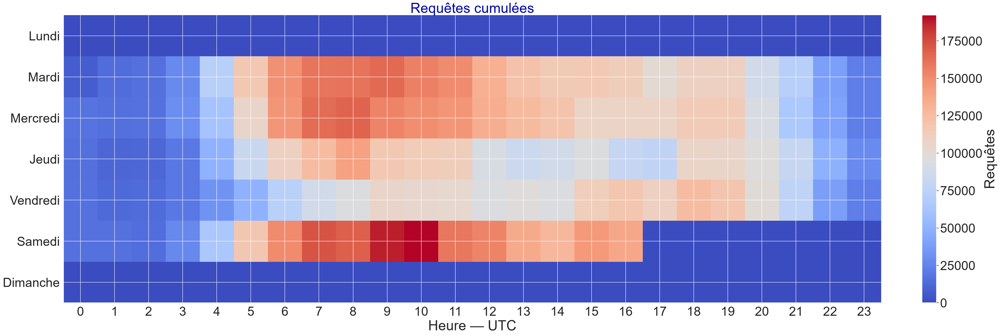

In [20]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
im = ax.imshow(heatmap.to_numpy(), aspect="auto", cmap="coolwarm")
ax.set_yticks(range(7), ["Lundi","Mardi","Mercredi","Jeudi","Vendredi","Samedi","Dimanche"])
ax.set_xticks(range(24)); ax.set_xlabel(f"Heure — {FUSEAU}")
fig.colorbar(im, ax=ax, label="Requêtes"); ax.set_title("Requêtes cumulées")
enregistrer(fig, "11_heatmap"); exporter(heatmap, "11_heatmap")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 12 — Distribution des tailles de réponse</div></b>

**Objectif :** Examiner la dispersion des octets de réponse.

**Lecture :** Chaque barre compte les réponses d’un intervalle ; l’axe vertical est logarithmique.

**Point de vigilance :** Les valeurs manquantes et négatives sont exclues.

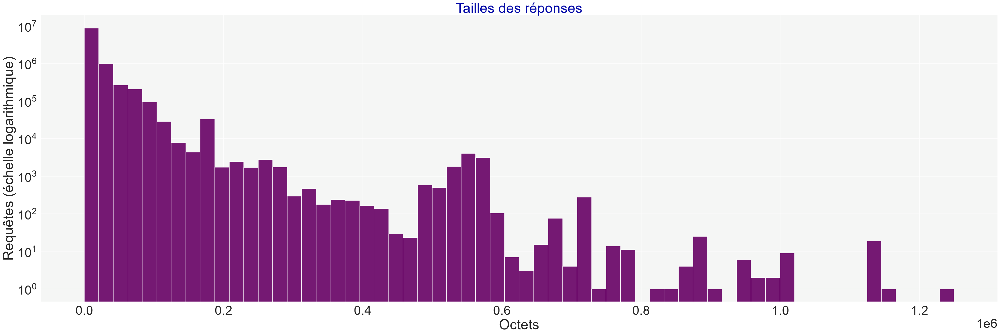

In [21]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
if histogramme.sum():
    ax.bar(bornes[:-1], histogramme, width=np.diff(bornes), align="edge", color=palette[5])
    ax.set_yscale("log")
else: vide(ax)
ax.set_xlabel("Octets"); ax.set_ylabel("Requêtes (échelle logarithmique)")
ax.set_title("Tailles des réponses")
enregistrer(fig, "12_tailles")
exporter(pd.DataFrame({"borne_basse":bornes[:-1],"borne_haute":bornes[1:],"requetes":histogramme}), "12_tailles")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 13 — Versions d’adresse IP</div></b>

**Objectif :** Comparer IPv4 et IPv6.

**Lecture :** Les parts sont pondérées par le nombre de requêtes.

**Point de vigilance :** Les valeurs inconnues restent visibles.

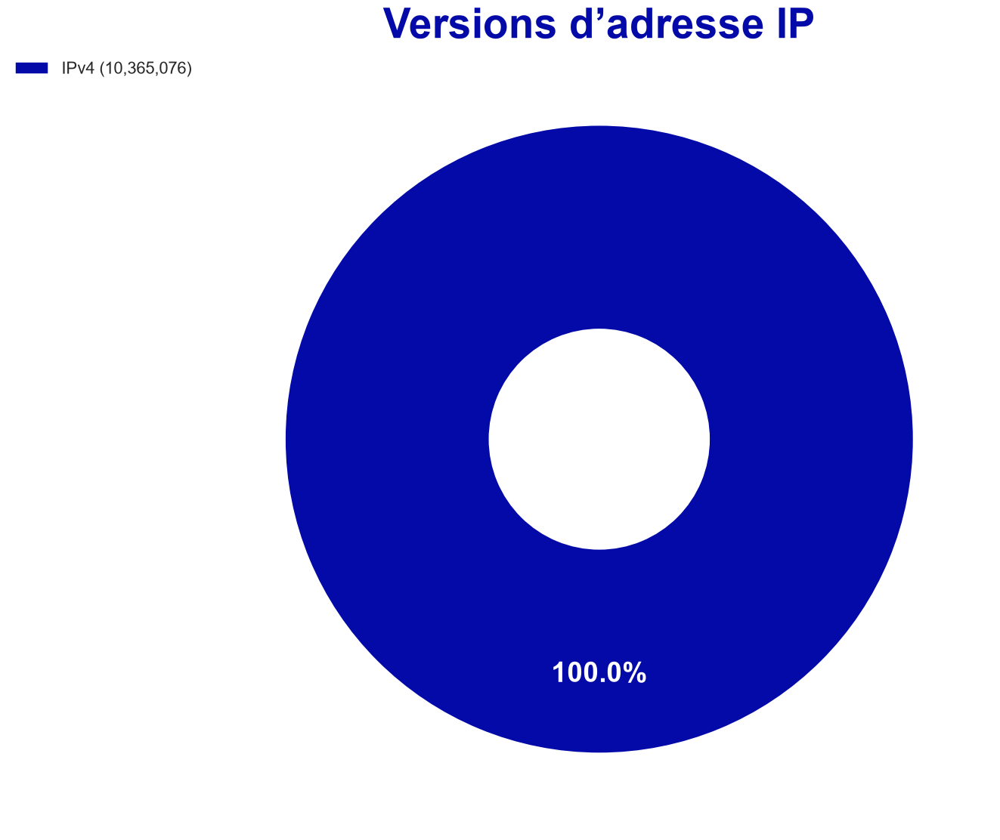

In [22]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
versions = comptages["ip_version"].rename(index={"4":"IPv4","6":"IPv6","4.0":"IPv4","6.0":"IPv6"})
fig, ax = plt.subplots(figsize=(12,10), layout="constrained")
secteurs(ax, versions, "Versions d’adresse IP")
enregistrer(fig, "13_versions_ip"); exporter(versions.rename("requetes"), "13_versions_ip")

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Qualité de service et erreurs</div></b>

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 14 — Taux d’erreurs horaires</div></b>

**Objectif :** Détecter une dégradation relative du service.

**Lecture :** Comparer les pourcentages 4xx et 5xx au fil du temps.

**Point de vigilance :** Le dénominateur inclut toutes les requêtes ; une heure sans trafic reste sans taux.

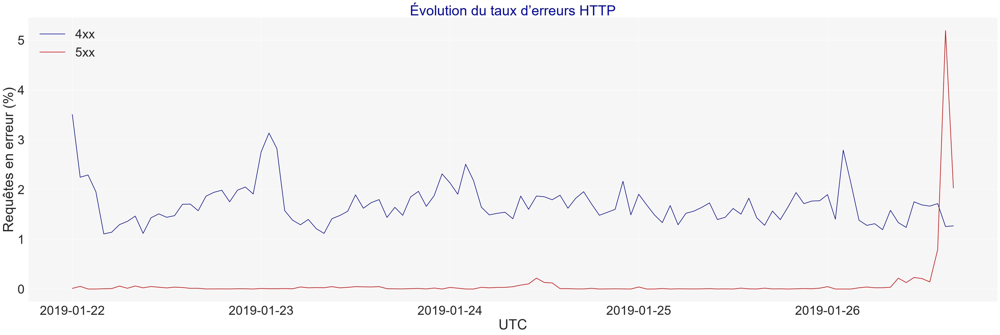

In [23]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36, 12), layout="constrained")
if horaire.empty:
    vide(ax)
else:
    ax.plot(horaire.index, horaire.taux4_pct, label="4xx", color=palette[0]) #"#f29927")
    ax.plot(horaire.index, horaire.taux5_pct, label="5xx", color=palette[1]) #
    ax.legend(); ax.set_ylabel("Requêtes en erreur (%)"); ax.set_xlabel(FUSEAU)
ax.set_title("Évolution du taux d’erreurs HTTP")
enregistrer(fig, "14_taux_erreurs_horaires"); exporter(horaire, "14_taux_erreurs_horaires")

In [24]:
# 15. URL : volumes et taux dans une même figure
url_erreurs = par_categorie("url_path")
selection = url_erreurs[url_erreurs.requetes >= SEUIL_REQUETES].sort_values("erreurs", ascending=False).head(TOP_N).iloc[::-1]


### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 15 — URL — volume d’erreurs</div></b>

**Objectif :** Prioriser les URL à examiner.

**Lecture :** Le même top est classé par volume d’erreurs ; les deux figures sont comparables.

**Point de vigilance :** Seules les URL dépassant SEUIL_REQUETES sont retenues ; une erreur attendue peut être normale.

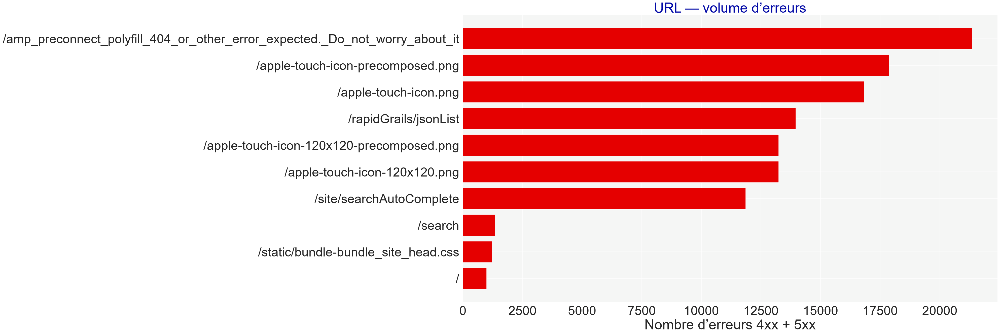

In [25]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
if selection.empty: vide(ax)
else:
    pos = np.arange(len(selection))
    ax.barh(pos, selection["erreurs"], color=palette[1])
    ax.set_yticks(pos, [str(s)[:80] for s in selection.index])
ax.set_xlabel("Nombre d’erreurs 4xx + 5xx"); ax.set_title("URL — volume d’erreurs")
enregistrer(fig, "15_url_erreurs"); exporter(url_erreurs, "15_url_erreurs")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 16 — URL — taux d’erreur</div></b>

**Objectif :** Prioriser les URL à examiner.

**Lecture :** Le même top est classé par volume d’erreurs ; les deux figures sont comparables.

**Point de vigilance :** Seules les URL dépassant SEUIL_REQUETES sont retenues ; une erreur attendue peut être normale.

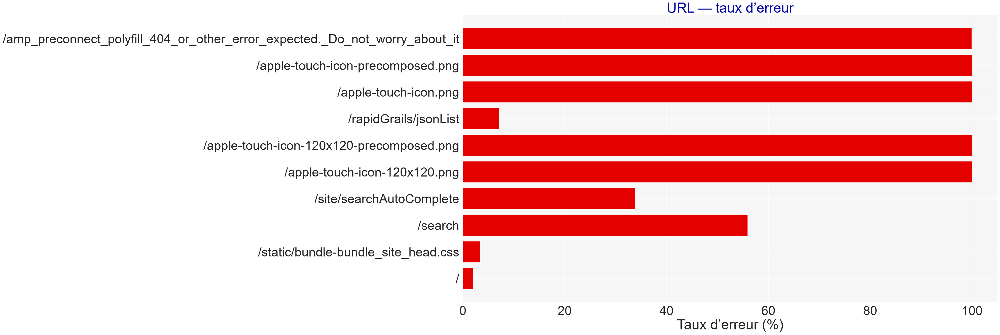

In [26]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
if selection.empty: vide(ax)
else:
    pos = np.arange(len(selection))
    ax.barh(pos, selection["taux_erreur_pct"], color=palette[1])
    ax.set_yticks(pos, [str(s)[:80] for s in selection.index])
ax.set_xlabel("Taux d’erreur (%)"); ax.set_title("URL — taux d’erreur")
enregistrer(fig, "16_url_taux_erreur_pct"); exporter(url_erreurs, "15_url_erreurs")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 17 — Erreurs par jour et heure</div></b>

**Objectif :** Localiser les créneaux concentrant les erreurs.

**Lecture :** La couleur compte les réponses 4xx et 5xx.

**Point de vigilance :** Un fort volume peut simplement refléter un trafic plus élevé.

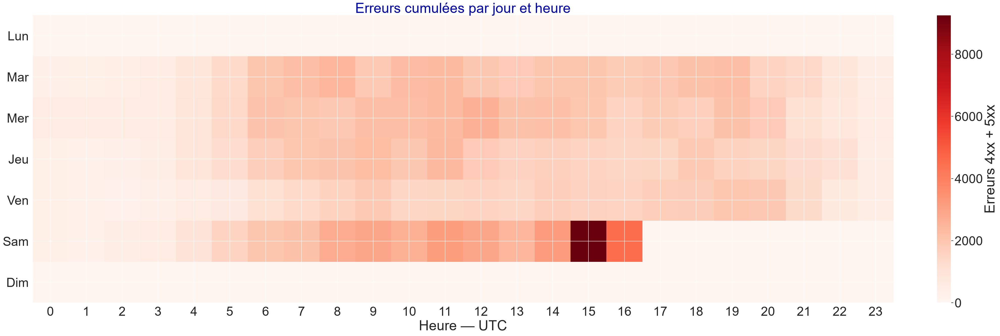

In [27]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
local = temps.dt.tz_convert(FUSEAU)
hm_erreurs = pd.crosstab(local[erreurs].dt.dayofweek, local[erreurs].dt.hour).reindex(index=range(7), columns=range(24), fill_value=0)
fig, ax = plt.subplots(figsize=(36, 12), layout="constrained")
im = ax.imshow(hm_erreurs, aspect="auto", cmap="Reds")
ax.set_yticks(range(7), ["Lun", "Mar", "Mer", "Jeu", "Ven", "Sam", "Dim"])
ax.set_xticks(range(24)); ax.set_xlabel(f"Heure — {FUSEAU}")
fig.colorbar(im, ax=ax, label="Erreurs 4xx + 5xx")
ax.set_title("Erreurs cumulées par jour et heure")
enregistrer(fig, "17_heatmap_erreurs"); exporter(hm_erreurs, "17_heatmap_erreurs")
del local

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 18 — Codes HTTP par méthode</div></b>

**Objectif :** Comparer les résultats des méthodes HTTP.

**Lecture :** Chaque barre est normalisée à 100 %.

**Point de vigilance :** Comparer aussi les effectifs Parquet pour éviter de surinterpréter une méthode rare.

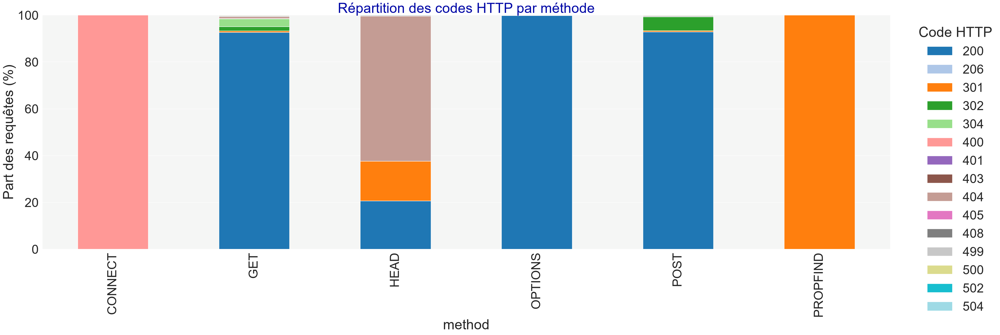

In [28]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
http_methode = pd.crosstab(nettoyer(df.method), nettoyer(df.status.astype("string")))
fig, ax = plt.subplots(figsize=(36, 12), layout="constrained")
if http_methode.empty:
    vide(ax)
else:
    http_methode.div(http_methode.sum(axis=1), axis=0).mul(100).plot.bar(stacked=True, ax=ax, colormap= "tab20")
    ax.set_ylabel("Part des requêtes (%)"); ax.legend(title="Code HTTP", bbox_to_anchor=(1.02, 1))
ax.set_title("Répartition des codes HTTP par méthode")
enregistrer(fig, "18_http_methodes"); exporter(http_methode, "18_http_methodes")

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Bots et comportements par IP</div></b>

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 19 — Bots et autres clients dans le temps</div></b>

**Objectif :** Mesurer la contribution des bots aux pics.

**Lecture :** Les courbes distinguent les bots identifiés, les autres clients et les inconnus.

**Point de vigilance :** Un bot non détecté appartient aux autres clients.

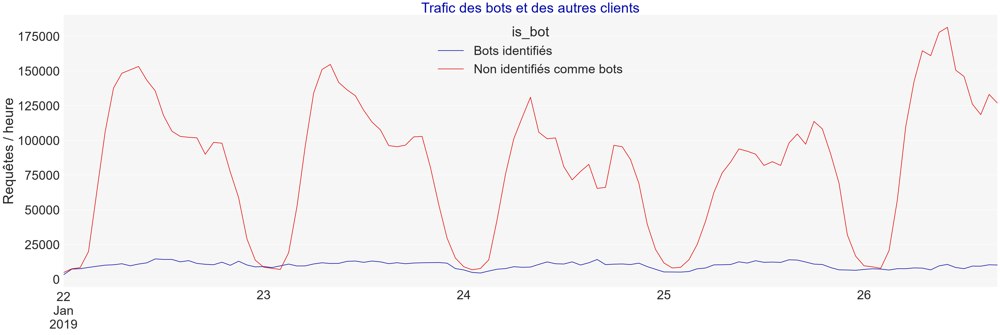

In [29]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
bots_temps = pd.crosstab(heure, label_bot)
if len(bots_temps):
    bots_temps = bots_temps.reindex(pd.date_range(bots_temps.index.min(), bots_temps.index.max(), freq="h"), fill_value=0)
    bots_temps.index = bots_temps.index.tz_convert(FUSEAU)
fig, ax = plt.subplots(figsize=(36, 12), layout="constrained")
if bots_temps.empty: vide(ax)
else: bots_temps.plot(ax=ax); ax.set_ylabel("Requêtes / heure")
ax.set_title("Trafic des bots et des autres clients")
enregistrer(fig, "19_bots_temps"); exporter(bots_temps, "19_bots_temps")

In [30]:
# 19. Robots les plus consommateurs
octets = pd.to_numeric(df.bytes, errors="coerce").where(lambda s: s.ge(0))
masque_bot = bot.fillna(False)
temp = pd.DataFrame({"robot": nettoyer(df.loc[masque_bot, "bot_name"]), "octets": octets[masque_bot]})
bots_classement = temp.groupby("robot").agg(requetes=("robot", "size"), octets=("octets", "sum"), tailles_connues=("octets", "count"))


### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 20 — Robots — volume de requêtes</div></b>

**Objectif :** Identifier les robots consommateurs.

**Lecture :** Le classement porte sur les robots identifiés uniquement.

**Point de vigilance :** Les octets absents ne contribuent pas aux totaux.

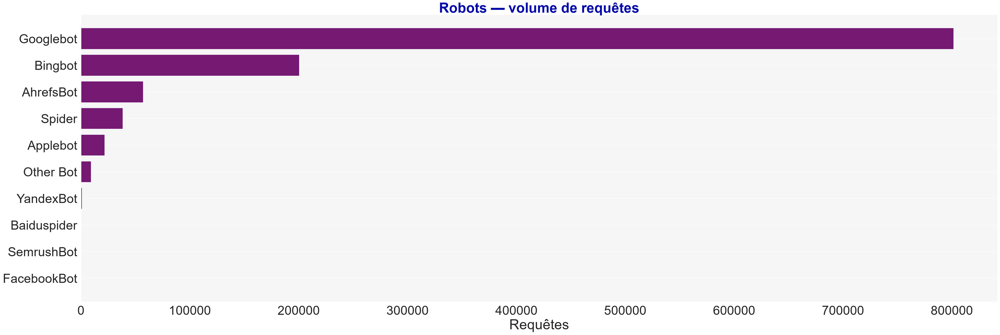

In [31]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
barres(ax, bots_classement["requetes"].sort_values(ascending=False), "Robots — volume de requêtes", palette[5])
ax.set_xlabel("Requêtes")
enregistrer(fig, "20_bots_requetes"); exporter(bots_classement, "20_bots_classement")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 21 — Robots — volume transféré</div></b>

**Objectif :** Identifier les robots consommateurs.

**Lecture :** Le classement porte sur les robots identifiés uniquement.

**Point de vigilance :** Les octets absents ne contribuent pas aux totaux.

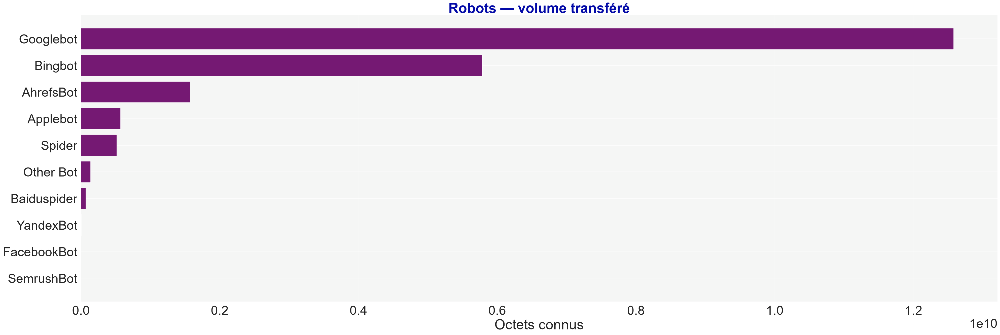

In [32]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
barres(ax, bots_classement["octets"].sort_values(ascending=False), "Robots — volume transféré", palette[5])
ax.set_xlabel("Octets connus")
enregistrer(fig, "21_bots_octets"); exporter(bots_classement, "21_bots_classement")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 22 — IP — volume et taux d’erreur</div></b>

**Objectif :** Repérer des profils atypiques.

**Lecture :** Chaque point représente une IP ; le volume est en échelle logarithmique.

**Point de vigilance :** Une IP partagée peut représenter plusieurs personnes ; ce n’est pas une preuve d’attaque.

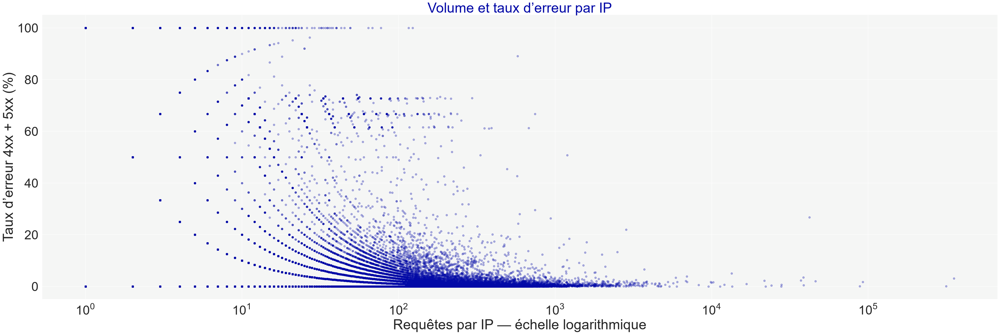

In [33]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
ip_valide = df.ip.notna() & ~df.ip.isin(["", "-"])
temp = pd.DataFrame({"ip": df.loc[ip_valide, "ip"], "erreur": erreurs[ip_valide], "chemin": df.loc[ip_valide, "url_path"]})
ip_stats = temp.groupby("ip", sort=False).agg(requetes=("erreur", "size"), erreurs=("erreur", "sum"), chemins_distincts=("chemin", "nunique"))
ip_stats = ip_stats.sort_values("requetes", ascending=False)
ip_stats["taux_erreur_pct"] = 100 * ip_stats.erreurs / ip_stats.requetes
identifiants = {ip: f"IP_{i:06d}" for i,ip in enumerate(ip_stats.index, 1)}
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
if ip_stats.empty: vide(ax)
else:
    ax.scatter(ip_stats.requetes, ip_stats.taux_erreur_pct, s=24, alpha=.3, rasterized=True)
    ax.set_xscale("log"); ax.set_xlabel("Requêtes par IP — échelle logarithmique"); ax.set_ylabel("Taux d’erreur 4xx + 5xx (%)")
ax.set_title("Volume et taux d’erreur par IP")
enregistrer(fig, "22_ip_volume_erreurs")
ip_export = ip_stats.rename(index=identifiants).rename_axis("identifiant_ip")
exporter(ip_export, "22_statistiques_ip")


### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 23 — Chemins distincts par IP</div></b>

**Objectif :** Repérer une exploration large du site.

**Lecture :** Le nombre de chemins est calculé sans échantillonnage.

**Point de vigilance :** Un crawler légitime peut visiter beaucoup de chemins.

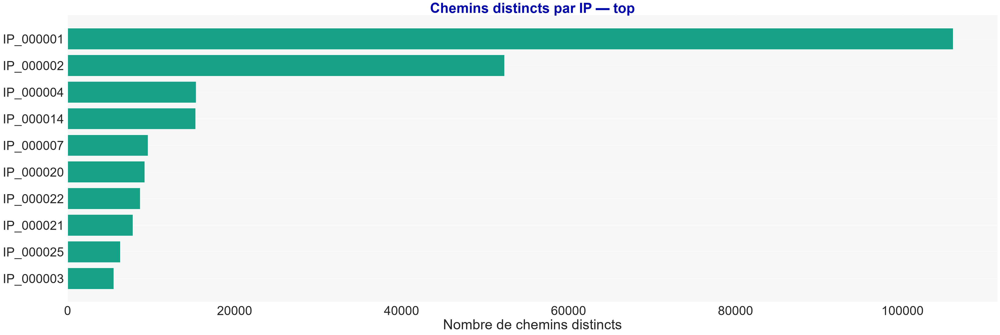

In [34]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
barres(ax, ip_export.chemins_distincts.sort_values(ascending=False), "Chemins distincts par IP — top", "#16a085")
ax.set_xlabel("Nombre de chemins distincts")
enregistrer(fig, "23_ip_chemins")
del temp, ip_export

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 24 — Rafales de requêtes par minute</div></b>

**Objectif :** Examiner les IP les plus actives.

**Lecture :** Les courbes détaillent chaque minute pour le top des IP en volume total.

**Point de vigilance :** Les IP hors du top ne sont pas affichées ; un pic bref peut leur échapper.

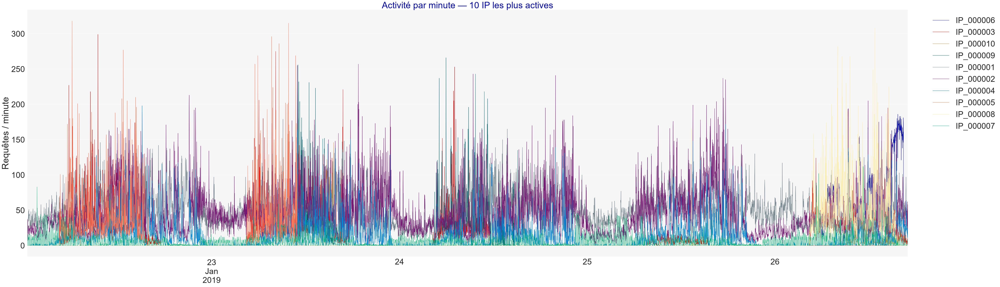

In [35]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
ip_selection = ip_stats.head(TOP_IP).index
masque_ip = df.ip.isin(ip_selection) & temps.notna()
rafales = pd.crosstab(temps[masque_ip].dt.floor("min"), df.loc[masque_ip, "ip"])
if len(rafales):
    rafales = rafales.reindex(pd.date_range(rafales.index.min(), rafales.index.max(), freq="min"), fill_value=0)
    rafales.index = rafales.index.tz_convert(FUSEAU)
rafales = rafales.rename(columns=identifiants)
fig, ax = plt.subplots(figsize=(56,16), layout="constrained")
if rafales.empty: vide(ax)
else: rafales.plot(ax=ax, linewidth=1); ax.set_ylabel("Requêtes / minute"); ax.legend(bbox_to_anchor=(1.02,1))
ax.set_title(f"Activité par minute — {TOP_IP} IP les plus actives")
enregistrer(fig, "24_rafales_ip"); exporter(rafales, "24_rafales_ip")
del ip_stats, identifiants, rafales, masque_ip, ip_valide

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Contenus et consommation de bande passante</div></b>

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 25 — Octets transférés par heure</div></b>

**Objectif :** Identifier les pics de consommation réseau.

**Lecture :** Les valeurs sont exprimées en Mio par heure.

**Point de vigilance :** Il s’agit des tailles de réponses connues, pas du débit réseau total.

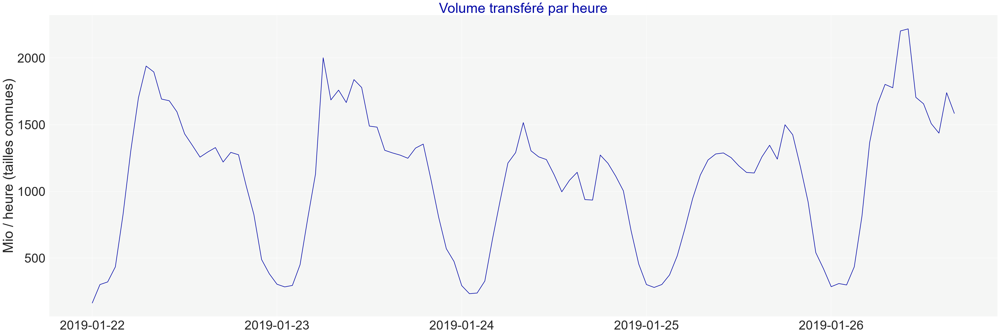

In [36]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
bande_passante = pd.DataFrame({"heure": heure, "octets": octets}).groupby("heure").agg(octets=("octets", "sum"), tailles_connues=("octets", "count"))
if len(bande_passante):
    bande_passante = bande_passante.reindex(pd.date_range(bande_passante.index.min(), bande_passante.index.max(), freq="h"), fill_value=0)
    bande_passante.index = bande_passante.index.tz_convert(FUSEAU)
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
if bande_passante.empty: vide(ax)
else: ax.plot(bande_passante.index, bande_passante.octets / 1024**2); ax.set_ylabel("Mio / heure (tailles connues)")
ax.set_title("Volume transféré par heure")
enregistrer(fig, "25_bande_passante"); exporter(bande_passante, "25_bande_passante")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 26 — URL par volume transféré</div></b>

**Objectif :** Identifier les ressources les plus coûteuses.

**Lecture :** Les barres cumulent les octets par chemin.

**Point de vigilance :** La somme ignore les réponses de taille absente ou négative.

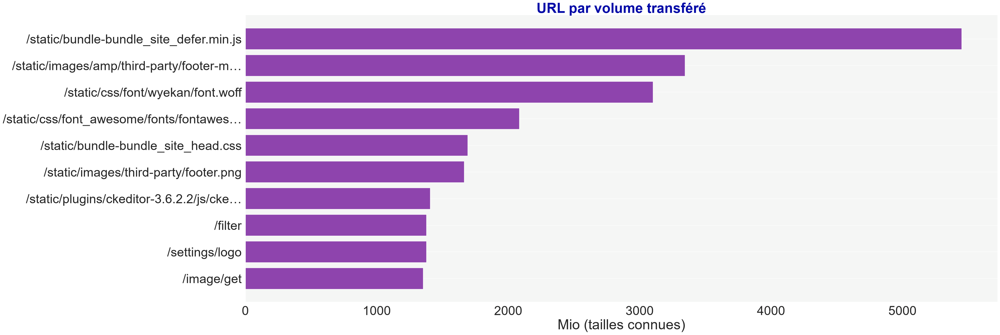

In [37]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
url_octets = pd.DataFrame({"chemin": nettoyer(df.url_path), "octets": octets}).groupby("chemin").agg(octets=("octets", "sum"), tailles_connues=("octets", "count"))
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
barres(ax, (url_octets.octets / 1024**2).sort_values(ascending=False), "URL par volume transféré", "#8e44ad")
ax.set_xlabel("Mio (tailles connues)")
enregistrer(fig, "26_url_octets"); exporter(url_octets, "26_url_octets")
del url_octets

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 27 — Concentration du trafic — Pareto</div></b>

**Objectif :** Mesurer la concentration des requêtes.

**Lecture :** Lire combien de chemins suffisent pour atteindre 80 % du trafic.

**Point de vigilance :** Le classement inclut les chemins non renseignés dans leur catégorie.

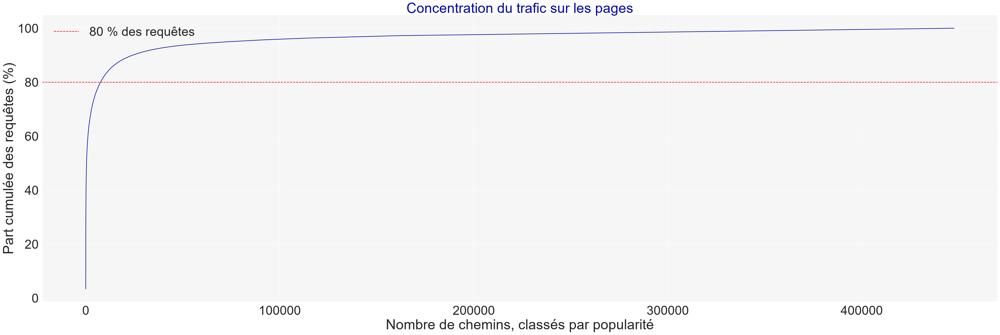

In [38]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
pages = comptages["url_path"].sort_values(ascending=False)
pareto = pd.DataFrame({"requetes": pages, "part_cumulee_pct": pages.cumsum() / pages.sum() * 100})
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
ax.plot(np.arange(1, len(pareto)+1), pareto.part_cumulee_pct)
ax.axhline(80, color="red", linestyle="--", label="80 % des requêtes")
ax.set_xlabel("Nombre de chemins, classés par popularité"); ax.set_ylabel("Part cumulée des requêtes (%)")
ax.set_title("Concentration du trafic sur les pages"); ax.legend()
enregistrer(fig, "27_pareto_pages"); exporter(pareto, "27_pareto_pages")

In [40]:
#Types de ressources : classification des chemins distincts avant mappage
import re
familles = {"html": "Pages HTML", "htm": "Pages HTML", "css": "CSS", "js": "JavaScript", "mjs": "JavaScript",
            **dict.fromkeys(["png","jpg","jpeg","gif","svg","webp","ico","avif"], "Images"),
            **dict.fromkeys(["woff","woff2","ttf","otf","eot"], "Polices"),
            **dict.fromkeys(["mp4","webm","mp3","wav","ogg"], "Audio / vidéo"),
            **dict.fromkeys(["pdf","doc","docx","xls","xlsx","zip","gz"], "Documents / archives")}
def famille(chemin):
    if pd.isna(chemin) or chemin in ("", "-"): return "Non renseigné"
    fin = str(chemin).rsplit("/",1)[-1]
    m = re.search(r"\.([a-zA-Z0-9]+)$", fin)
    return familles.get(m.group(1).lower(), "Autres extensions") if m else "Sans extension"
mapping = {p: famille(p) for p in df.url_path.dropna().unique()}
ressource = df.url_path.map(mapping).fillna("Non renseigné")
ressources = pd.DataFrame({"type": ressource, "octets": octets}).groupby("type").agg(requetes=("type", "size"), octets=("octets", "sum"))

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 28 — Types de ressources — requêtes</div></b>

**Objectif :** Décrire la composition du contenu servi.

**Lecture :** Les chemins sont classés par extension avant agrégation.

**Point de vigilance :** Une extension n’est pas un type MIME ; « sans extension » inclut notamment des routes dynamiques.

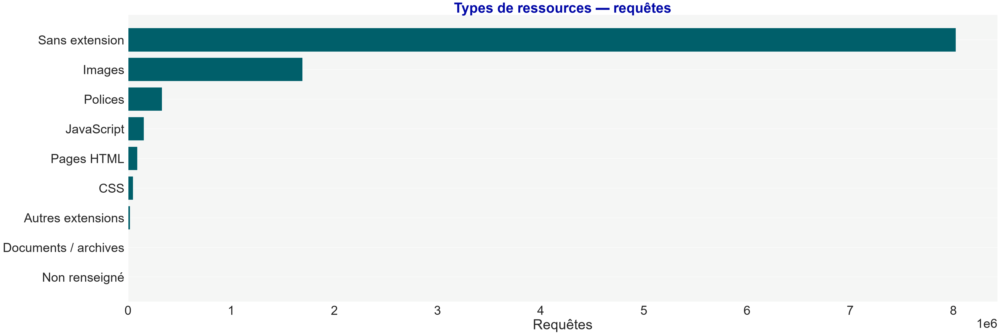

In [41]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
barres(ax, (ressources.requetes).sort_values(ascending=False), "Types de ressources — requêtes", palette[3])
ax.set_xlabel("Requêtes")
enregistrer(fig, "28_ressources_requetes"); exporter(ressources, "28_types_ressources")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 29 — Types de ressources — volume</div></b>

**Objectif :** Décrire la composition du contenu servi.

**Lecture :** Les chemins sont classés par extension avant agrégation.

**Point de vigilance :** Une extension n’est pas un type MIME ; « sans extension » inclut notamment des routes dynamiques.

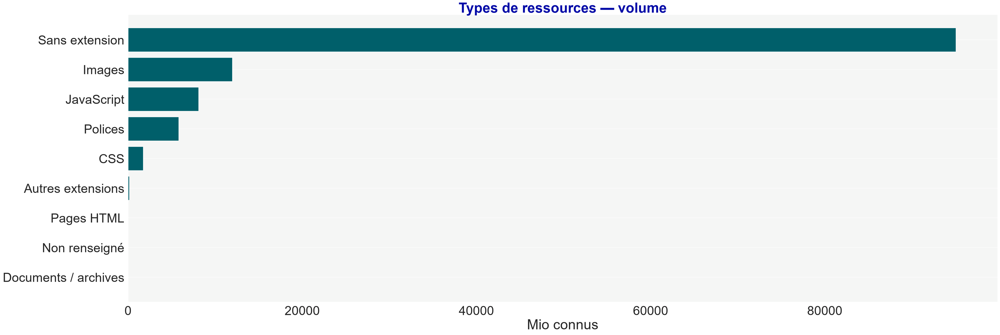

In [42]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
barres(ax, (ressources.octets/1024**2).sort_values(ascending=False), "Types de ressources — volume", palette[3])
ax.set_xlabel("Mio connus")
enregistrer(fig, "29_ressources_octets"); exporter(ressources, "29_types_ressources")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 30 — Tailles de réponses par classe HTTP</div></b>

**Objectif :** Comparer les distributions entre réponses réussies et erreurs.

**Lecture :** Chaque classe HTTP est normalisée indépendamment ; les abscisses sont log10(1 + octets).

**Point de vigilance :** Les classes rares peuvent avoir un profil instable ; les effectifs figurent en légende.

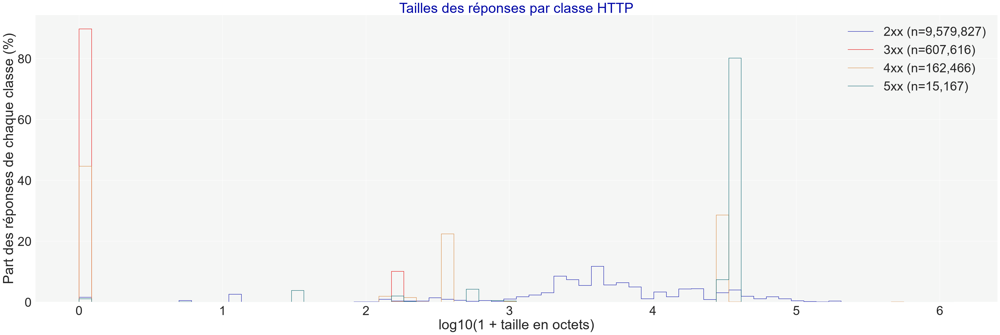

In [43]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
fig, ax = plt.subplots(figsize=(36,12),layout="constrained")
borne_max = np.log10(1 + float(octets.max())) if octets.notna().any() else 1
bins = np.linspace(0, max(1, borne_max), NB_CLASSES_TAILLE+1)
distributions = pd.DataFrame({"borne_basse_log10": bins[:-1], "borne_haute_log10": bins[1:]})
for classe in range(1,6):
    vals = octets[statuts.between(classe*100, classe*100+99).fillna(False)].dropna().to_numpy(dtype=float)
    counts, _ = np.histogram(np.log10(1+vals), bins=bins)
    distributions[f"{classe}xx"] = counts
    if counts.sum(): ax.stairs(counts / counts.sum()*100, bins, label=f"{classe}xx (n={len(vals):,})")
ax.set_xlabel("log10(1 + taille en octets)"); ax.set_ylabel("Part des réponses de chaque classe (%)")
ax.set_title("Tailles des réponses par classe HTTP")
if ax.get_legend_handles_labels()[0]: ax.legend()
enregistrer(fig, "30_tailles_http"); exporter(distributions, "30_tailles_http")
del vals

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Acquisition et profils des clients</div></b>

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 31 — Sources de trafic dans le temps</div></b>

**Objectif :** Suivre la provenance des requêtes.

**Lecture :** L’aire de chaque source représente son volume horaire.

**Point de vigilance :** Les catégories reprennent referer_type et ne garantissent pas une attribution marketing.

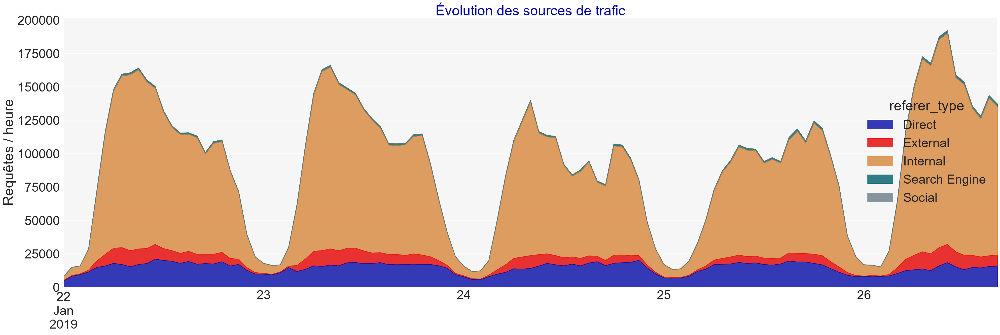

In [44]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
sources = nettoyer(df.referer_type)
sources_temps = pd.crosstab(heure, sources)
if len(sources_temps):
    sources_temps = sources_temps.reindex(pd.date_range(sources_temps.index.min(), sources_temps.index.max(), freq="h"), fill_value=0)
    sources_temps.index = sources_temps.index.tz_convert(FUSEAU)
fig, ax = plt.subplots(figsize=(36,12),layout="constrained")
if sources_temps.empty: vide(ax)
else: sources_temps.plot.area(ax=ax, alpha=.8); ax.set_ylabel("Requêtes / heure")
ax.set_title("Évolution des sources de trafic")
enregistrer(fig, "31_sources_temps"); exporter(sources_temps, "31_sources_temps")

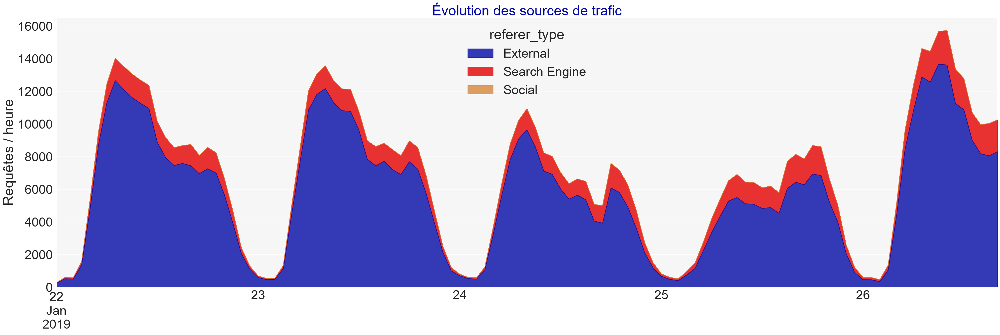

In [45]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
sources = nettoyer(df.referer_type)
sources_temps = pd.crosstab(heure, sources)
sources_temps =sources_temps[['External', 'Search Engine', 'Social']]
if len(sources_temps):
    sources_temps = sources_temps.reindex(pd.date_range(sources_temps.index.min(), sources_temps.index.max(), freq="h"), fill_value=0)
    sources_temps.index = sources_temps.index.tz_convert(FUSEAU)
fig, ax = plt.subplots(figsize=(36,12),layout="constrained")
if sources_temps.empty: vide(ax)
else: sources_temps.plot.area(ax=ax, alpha=.8); ax.set_ylabel("Requêtes / heure")
ax.set_title("Évolution des sources de trafic")
enregistrer(fig, "31.1_sources_temps"); exporter(sources_temps, "31.1_sources_temps")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 32 — Moteurs de recherche</div></b>

**Objectif :** Comparer les sources identifiées.

**Lecture :** Les barres montrent les requêtes dont la source est renseignée.

**Point de vigilance :** Les référents peuvent être supprimés par les navigateurs.

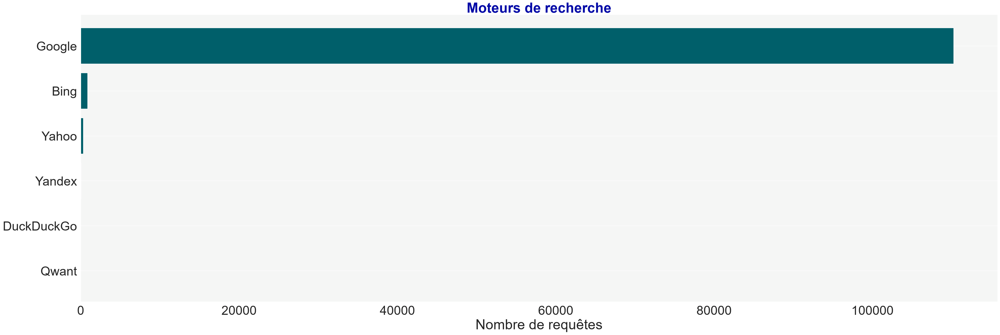

In [46]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
serie = effectifs(df["search_engine"]).drop("Non renseigné", errors="ignore")
fig, ax = plt.subplots(figsize=(36,12), layout="constrained")
barres(ax, serie, "Moteurs de recherche", palette[3])
enregistrer(fig, "32_search_engine"); exporter(serie.rename("requetes"), "32_search_engine")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 33 — Réseaux sociaux</div></b>

**Objectif :** Comparer les sources identifiées.

**Lecture :** Les barres montrent les requêtes dont la source est renseignée.

**Point de vigilance :** Les référents peuvent être supprimés par les navigateurs.

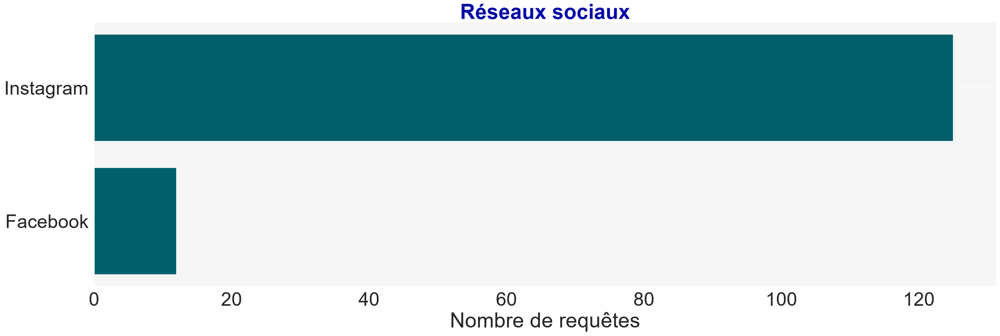

In [47]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
serie = effectifs(df["social_network"]).drop("Non renseigné", errors="ignore")
fig, ax = plt.subplots(figsize=(24,8), layout="constrained")
barres(ax, serie, "Réseaux sociaux", palette[3])
enregistrer(fig, "33_social_network"); exporter(serie.rename("requetes"), "33_social_network")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 34 — Appareils selon la source</div></b>

**Objectif :** Comparer les profils des clients entre sources.

**Lecture :** Chaque barre représente 100 % des requêtes d’une source.

**Point de vigilance :** Les proportions de petites sources doivent être interprétées avec leurs effectifs.

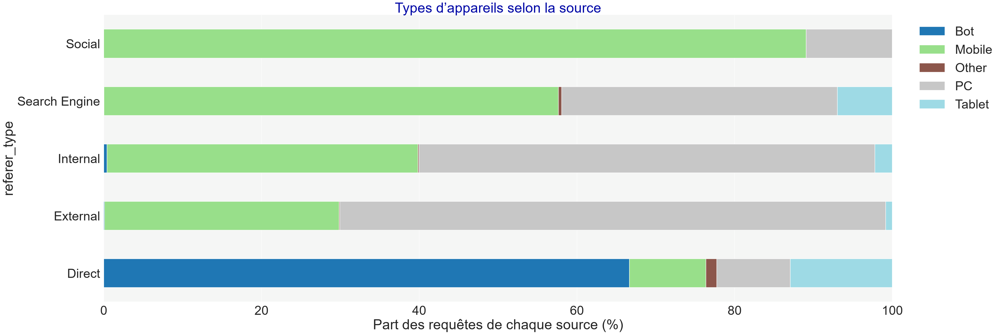

In [48]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
appareils_sources = pd.crosstab(sources, nettoyer(df.device_type))
fig, ax = plt.subplots(figsize=(36,12),layout="constrained")
if appareils_sources.empty: vide(ax)
else:
    appareils_sources.div(appareils_sources.sum(axis=1),axis=0).mul(100).plot.barh(stacked=True,ax=ax,colormap="tab20")
    ax.set_xlabel("Part des requêtes de chaque source (%)"); ax.legend(bbox_to_anchor=(1.02,1))
ax.set_title("Types d’appareils selon la source")
enregistrer(fig, "34_appareils_sources"); exporter(appareils_sources, "34_appareils_sources")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 35 — Taux d’erreur par navigateur</div></b>

**Objectif :** Repérer les catégories présentant beaucoup d’erreurs.

**Lecture :** Comparer les taux pour les catégories dépassant le seuil minimal.

**Point de vigilance :** Un écart peut provenir des URL demandées ou de robots, sans incompatibilité du client.

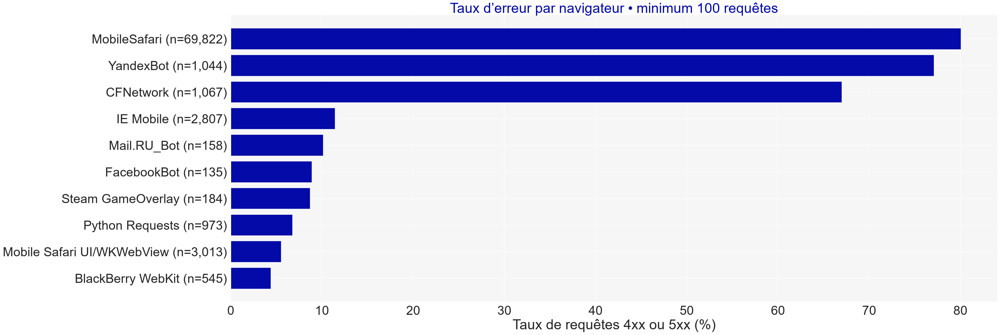

In [49]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
graphique_taux(par_categorie("browser"), "Taux d’erreur par navigateur", "35_erreurs_browser")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 36 — Taux d’erreur par système</div></b>

**Objectif :** Repérer les catégories présentant beaucoup d’erreurs.

**Lecture :** Comparer les taux pour les catégories dépassant le seuil minimal.

**Point de vigilance :** Un écart peut provenir des URL demandées ou de robots, sans incompatibilité du client.

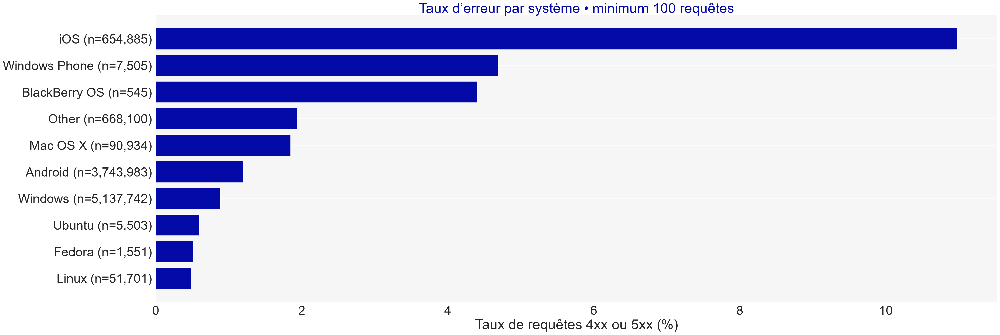

In [50]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
graphique_taux(par_categorie("os"), "Taux d’erreur par système", "36_erreurs_os")

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 37 — Bots par pays</div></b>

**Objectif :** Mieux interpréter la répartition géographique.

**Lecture :** Les principaux pays en volume sont comparés en proportions de bots.

**Point de vigilance :** La géolocalisation concerne les IP et peut refléter un proxy ou un hébergeur.

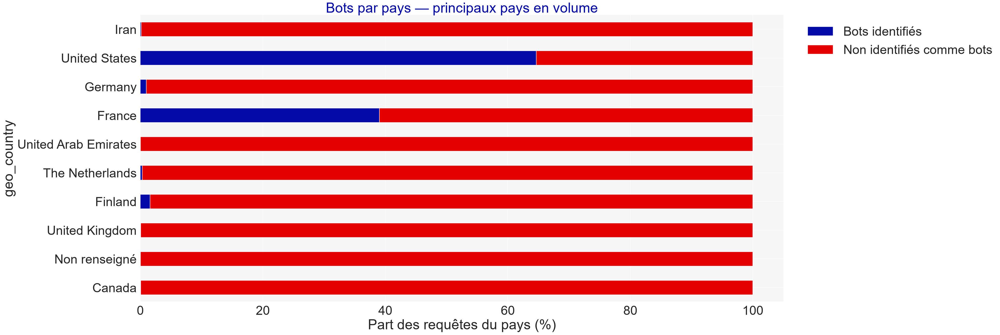

In [51]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
bots_pays = pd.crosstab(nettoyer(df.geo_country), label_bot)
bots_pays = bots_pays.loc[bots_pays.sum(axis=1).sort_values(ascending=False).index]
fig, ax = plt.subplots(figsize=(36,12),layout="constrained")
if bots_pays.empty: vide(ax)
else:
    bots_pays.head(TOP_N).iloc[::-1].pipe(lambda t: t.div(t.sum(axis=1),axis=0)*100).plot.barh(stacked=True,ax=ax)
    ax.set_xlabel("Part des requêtes du pays (%)"); ax.legend(bbox_to_anchor=(1.02,1))
ax.set_title("Bots par pays — principaux pays en volume")
enregistrer(fig, "37_bots_pays"); exporter(bots_pays, "37_bots_pays")

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Qualité des données</div></b>

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Graphique 38 — Complétude de toutes les colonnes</div></b>

**Objectif :** Identifier les analyses limitées par les valeurs absentes.

**Lecture :** Les barres comptent les valeurs nulles, vides, espaces seuls et tirets.

**Point de vigilance :** Le contrôle ne valide pas toutes les valeurs présentes : une valeur renseignée peut être incorrecte.

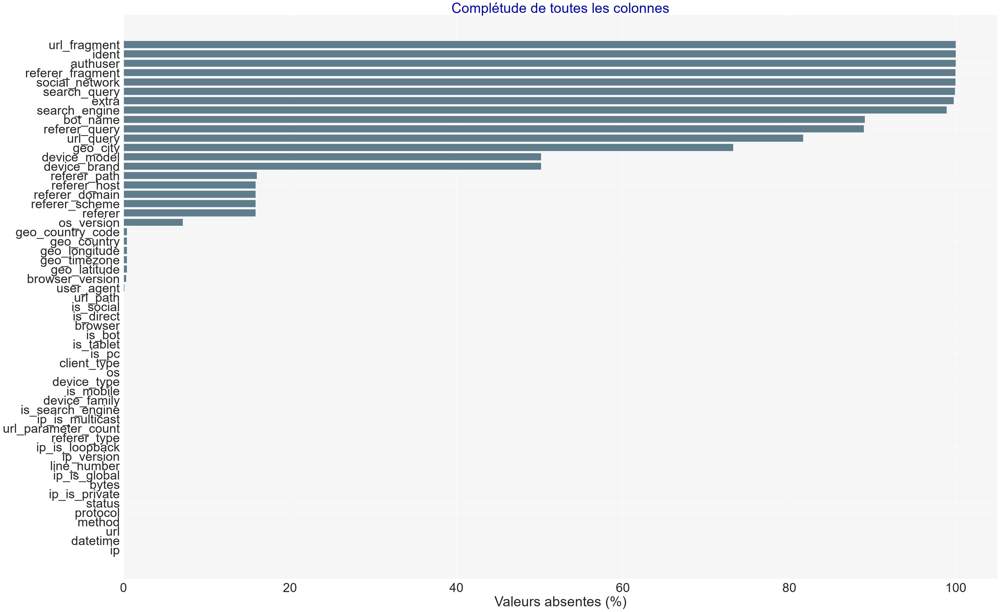

In [52]:
# Préparer les agrégats utiles, tracer cette figure et sauvegarder le résultat.
absences = {}
for colonne in df.columns:
    serie = df[colonne]
    total = int(serie.isna().sum())
    if pd.api.types.is_object_dtype(serie.dtype) or pd.api.types.is_string_dtype(serie.dtype) or isinstance(serie.dtype, pd.CategoricalDtype):
        for valeur, nombre in serie.value_counts(dropna=True).items():
            if isinstance(valeur, str) and valeur.strip() in ("", "-"):
                total += int(nombre)
    absences[colonne] = total
qualite_complete = pd.DataFrame({"absentes": pd.Series(absences)})
qualite_complete["pct_absentes"] = qualite_complete.absentes / len(df) * 100
qualite_complete = qualite_complete.sort_values("pct_absentes")
fig, ax = plt.subplots(figsize=(36, max(12, len(df.columns)*.40)),layout="constrained")
ax.barh(qualite_complete.index, qualite_complete.pct_absentes, color="#607d8b")
ax.set_xlim(0,105); ax.set_xlabel("Valeurs absentes (%)")
ax.set_title("Complétude de toutes les colonnes")
enregistrer(fig, "38_qualite_donnees"); exporter(qualite_complete, "38_qualite_donnees")

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align:left'>Contrôles et sauvegardes</div></b>

In [53]:
assert int(trafic.sum()) == int(temps.notna().sum())
assert int(heatmap.to_numpy().sum()) == int(temps.notna().sum())
assert int(hm_erreurs.to_numpy().sum()) == int((erreurs & temps.notna()).sum())
assert int(http_methode.to_numpy().sum()) == len(df)
assert int(bots_pays.to_numpy().sum()) == len(df)
assert int(ressources.requetes.sum()) == len(df)
assert int(bots_temps.to_numpy().sum()) == int(temps.notna().sum())
assert int(appareils_sources.to_numpy().sum()) == len(df)
assert qualite_complete.pct_absentes.between(0,100).all()

# Vérifier que chaque export est lisible et conserver un inventaire en Parquet.
import pyarrow.parquet as pq
inventaire = []
for chemin in sorted(repertoireDonnees.glob("*.parquet")):
    meta = pq.ParquetFile(chemin)
    inventaire.append({"fichier": chemin.name, "lignes": meta.metadata.num_rows,
                       "colonnes": len(meta.schema_arrow.names)})
inventaire = pd.DataFrame(inventaire)
exporter(inventaire, "inventaire_exports")
display(inventaire)
print("Contrôles de cohérence réussis. Tous les tableaux sont sauvegardés au format Parquet.")
print(f"Données : {repertoireDonnees.resolve()}")
print(f"Figures : {repertoireImages.resolve()}")


,fichier,lignes,colonnes
0,01_trafic.parquet,113,2
1,02_status.parquet,15,2
2,03_method.parquet,6,2
3,04_url_path.parquet,447568,2
4,05_geo_country.parquet,122,2
5,06_carte_pays.parquet,120,5
6,07_browser.parquet,162,2
7,08_os.parquet,16,2
8,09_device_type.parquet,5,2
9,10_referents.parquet,288,2


Contrôles de cohérence réussis. Tous les tableaux sont sauvegardés au format Parquet.
Données : C:\dockers\dockerBigDataBI\spark\notebooks\python\Analyse.exploratoire.logs\repertoire.donnees
Figures : C:\dockers\dockerBigDataBI\spark\notebooks\python\Analyse.exploratoire.logs\repertoire.images


**Réutiliser un résultat :** `pd.read_parquet(repertoireDonnees / "01_trafic.parquet")`. Les index des tableaux sont sauvegardés sous forme de colonnes pour faciliter leur réutilisation. Les PNG et le HTML sont des visualisations ; aucune donnée tabulaire n’est exportée en CSV.